<a href="https://colab.research.google.com/github/PokachalovaKseniya/ml-basics/blob/main/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%9613_%D0%93%D0%B5%D0%BE%D0%B0%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D1%8D%D0%BA%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D1%85_%D1%84%D0%B0%D0%BA%D1%82%D0%BE%D1%80%D0%BE%D0%B2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа. Геоанализ экологических факторов городской среды с применением методов пространственной кластеризации**




















## **Цель работы**



Освоение методов пространственного анализа и машинного обучения для оценки экологической обстановки городской территории с использованием гексагональной сетки H3, с последующим применением различных алгоритмов кластеризации и классификации.

## **Задачи**



1. Освоить инструменты загрузки и агрегации экологических геоданных с использованием API OpenStreetMap
2. Реализовать анализ пространственного распределения экологических факторов с помощью гексагональной сетки H3
3. Применить и сравнить различные алгоритмы кластеризации для выявления однородных экологических зон
4. Обучить модели классификации для прогнозирования экологического состояния новых территорий

## **Теоретическая часть**



Современный геоэкологический анализ требует комплексного подхода к обработке пространственно-распределенных данных. Применение методов машинного обучения, в частности алгоритмов кластеризации (K-means, агломеративной, спектральной, DBSCAN, HDBSCAN), позволяет выявлять неявные закономерности в распределении экологических факторов городской среды и определять территории со схожими экологическими характеристиками.

## **Этапы работы**



### **1. Определение области исследования и подготовка данных**


- Выберите городскую территорию для анализа экологической обстановки
- Используя API OpenStreetMap, загрузите данные следующих категорий:
  - Источники загрязнения (промышленные предприятия, мусоропереработка, ТЭЦ)
  - Зеленые насаждения (парки, скверы, лесопарковые зоны)
  - Водные объекты (реки, водоемы)
  - Автомагистрали (категории дорог с интенсивным движением)
  - Административные районы города

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 667.5/667.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.4/104.4 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 28.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.5/208.5 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 54.7 M

,слой,количество_объектов
0,pollution,1380
1,green,4314
2,water,458
3,highways,2293
4,admin_districts,161


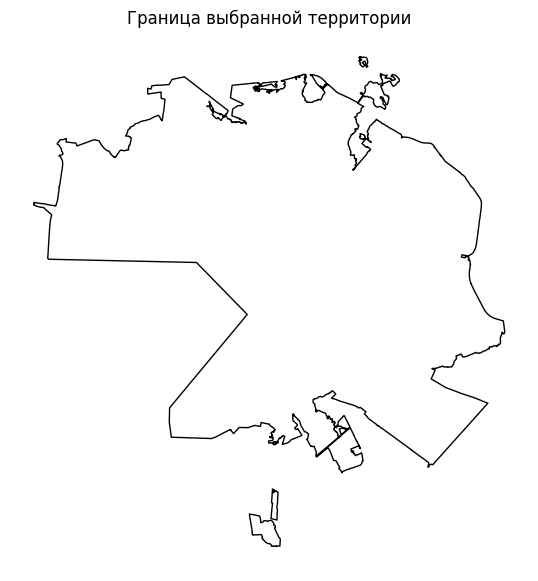

In [ ]:
!pip install scikit-learn geopandas h3 leafmap mapclassify matplotlib osmnx hdbscan joblib -q
import numpy as np
import pandas as pd
import geopandas as gpd
import osmnx as ox
import matplotlib.pyplot as plt
import h3
import leafmap
import hdbscan
import joblib

from shapely.geometry import Polygon
from IPython.display import display
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

place_name = "Казань, Россия"

ox.settings.use_cache = True
ox.settings.timeout = 180

city_boundary_wgs = ox.geocode_to_gdf(place_name).to_crs("EPSG:4326")
city_polygon = city_boundary_wgs.geometry.iloc[0]
crs_proj = city_boundary_wgs.estimate_utm_crs()
city_boundary = city_boundary_wgs.to_crs(crs_proj)
city_center = city_boundary_wgs.geometry.iloc[0].representative_point()

osm_tags = {
    "pollution": {
        "landuse": "industrial",
        "industrial": True,
        "power": "plant",
        "man_made": "works",
        "amenity": ["waste_transfer_station", "waste_disposal", "recycling"]
    },
    "green": {
        "leisure": ["park", "garden", "nature_reserve"],
        "landuse": ["forest", "grass", "recreation_ground"],
        "natural": ["wood", "scrub", "grassland"]
    },
    "water": {
        "natural": "water",
        "water": ["river", "lake", "pond", "reservoir"],
        "waterway": ["river", "stream", "canal", "drain"]
    },
    "highways": {
        "highway": ["motorway", "trunk", "primary", "secondary"]
    },
    "admin_districts": {
        "boundary": "administrative",
        "admin_level": ["8", "9", "10"]
    }
}

def load_layer(tags):
    try:
        layer = ox.features_from_polygon(city_polygon, tags=tags).reset_index()
        layer = layer[layer.geometry.notna()].copy()
        layer = gpd.GeoDataFrame(layer, geometry="geometry", crs="EPSG:4326")
    except Exception:
        layer = gpd.GeoDataFrame(columns=["geometry"], geometry="geometry", crs="EPSG:4326")
    return layer

data_wgs = {}
for layer_name, tags in osm_tags.items():
    data_wgs[layer_name] = load_layer(tags)

data = {}
for layer_name, layer in data_wgs.items():
    data[layer_name] = layer.to_crs(crs_proj)

layers_info = pd.DataFrame({
    "слой": list(data.keys()),
    "количество_объектов": [len(data[layer_name]) for layer_name in data.keys()]
})

print("Территория:", place_name)
print("Проекция:", crs_proj)
display(layers_info)

ax = city_boundary.plot(figsize=(7, 7), edgecolor="black", facecolor="none")
ax.set_title("Граница выбранной территории")
ax.set_axis_off()

Для анализа выбрана Казань. Город подходит для работы, потому что в нем есть плотная дорожная сеть, промышленные зоны, зеленые территории и водные объекты. Данные загружены из OpenStreetMap через OSMnx: источники загрязнения, зелень, вода, дороги и административные границы.

### **2. Агрегация данных с использованием гексагональной сетки H3**


- Сгенерируйте гексагональную сетку H3 оптимального разрешения для выбранной территории
- Для каждой ячейки H3 рассчитайте:
  - Количество и плотность источников загрязнения в радиусе 1600м
  - Площадь и процент покрытия зелеными насаждениями в радиусе 800м
  - Протяженность водных объектов в радиусе 1600м
  - Плотность автомагистралей в радиусе 1600м
- Выполните нормализацию полученных показателей
- Сформируйте интегральный индекс экологического благополучия территории


In [ ]:
h3_resolution = 8

h3_indexes = list(h3.geo_to_cells(city_polygon.__geo_interface__, h3_resolution))
h3_geometries = [
    Polygon([(lng, lat) for lat, lng in h3.cell_to_boundary(cell)])
    for cell in h3_indexes
]

h3_gdf_wgs = gpd.GeoDataFrame(
    {"h3_index": h3_indexes, "geometry": h3_geometries},
    crs="EPSG:4326"
)

h3_gdf_wgs = h3_gdf_wgs[h3_gdf_wgs.intersects(city_polygon)].copy()
h3_gdf_wgs["geometry"] = h3_gdf_wgs.geometry.intersection(city_polygon)
h3_gdf = h3_gdf_wgs.to_crs(crs_proj).reset_index(drop=True)

print("Количество H3-ячеек:", len(h3_gdf))

def count_objects_in_buffer(layer, buffer_geom):
    if layer.empty:
        return 0
    selected = layer[layer.geometry.intersects(buffer_geom)]
    return int(len(selected))

def area_in_buffer(layer, buffer_geom):
    if layer.empty:
        return 0
    selected = layer[layer.geometry.intersects(buffer_geom)].copy()
    if selected.empty:
        return 0
    return selected.geometry.intersection(buffer_geom).area.sum()

def length_in_buffer(layer, buffer_geom):
    if layer.empty:
        return 0
    selected = layer[layer.geometry.intersects(buffer_geom)].copy()
    if selected.empty:
        return 0
    return selected.geometry.intersection(buffer_geom).length.sum()

def analyze_cell(geom):
    buffer_1600 = geom.buffer(1600)
    buffer_800 = geom.buffer(800)
    area_1600_km2 = buffer_1600.area / 1_000_000
    area_800_m2 = buffer_800.area
    pollution_count = count_objects_in_buffer(data["pollution"], buffer_1600)
    green_area = area_in_buffer(data["green"], buffer_800)
    water_length = length_in_buffer(data["water"], buffer_1600)
    road_length = length_in_buffer(data["highways"], buffer_1600)
    pollution_density = pollution_count / area_1600_km2
    green_percent = green_area / area_800_m2 * 100
    water_length_km = water_length / 1000
    road_density = road_length / 1000 / area_1600_km2
    return pd.Series({
        "pollution_count_1600": pollution_count,
        "pollution_density_1600": pollution_density,
        "green_pct_800": green_percent,
        "water_length_1600": water_length_km,
        "road_density_1600": road_density
    })

metrics = h3_gdf.geometry.apply(analyze_cell)
h3_gdf = pd.concat([h3_gdf, metrics], axis=1)

normalizer = MinMaxScaler()
h3_gdf[["pollution_norm", "green_norm", "water_norm", "road_norm"]] = normalizer.fit_transform(
    h3_gdf[[
        "pollution_density_1600",
        "green_pct_800",
        "water_length_1600",
        "road_density_1600"
    ]]
)

h3_gdf["eco_index"] = (
    0.35 * h3_gdf["green_norm"]
    + 0.15 * h3_gdf["water_norm"]
    - 0.30 * h3_gdf["pollution_norm"]
    - 0.20 * h3_gdf["road_norm"]
)

display(h3_gdf[[
    "h3_index",
    "pollution_density_1600",
    "green_pct_800",
    "water_length_1600",
    "road_density_1600",
    "eco_index"
]].head())

Количество H3-ячеек: 763


,h3_index,pollution_density_1600,green_pct_800,water_length_1600,road_density_1600,eco_index
0,8810a8154bfffff,0.923488,19.139497,6.629452,0.066152,0.062848
1,8810a88995fffff,0.995010,0.000000,23.552021,0.266043,0.022358
2,8810a81039fffff,6.962567,7.660673,21.373055,3.154939,-0.235988
3,8810a80141fffff,0.000000,0.000000,0.000000,0.000000,0.000000
4,8810a8031bfffff,0.071019,11.748836,7.594689,0.000000,0.059854


Территория была разбита на H3-ячейки 8-го разрешения. Для источников загрязнения, водных объектов и дорог использован буфер 1600 м, а для зеленых зон - 800 м. Экологический индекс рассчитан по нормированным показателям: зелень имеет вес 0,35, вода - 0,15, загрязнение - -0,30, дорожная нагрузка - -0,20.

### **3. Определение оптимального числа кластеров**


- Постройте график метода локтя (Elbow method) для определения оптимального числа кластеров
- Оцените качество кластеризации с помощью внутренних метрик кластеризации
- Определите оптимальное число кластеров на основе комбинации различных метрик

Оптимальное число кластеров: 4


,k,inertia,silhouette,calinski_harabasz,davies_bouldin,rank_silhouette,rank_calinski,rank_davies,rank_sum
0,2,2194.883,0.445,561.720,0.930,1.0,3.0,2.0,6.0
1,3,1582.279,0.337,536.221,1.023,4.0,5.0,4.0,13.0
2,4,1133.463,0.384,598.545,0.888,2.0,1.0,1.0,4.0
3,5,938.451,0.372,580.857,0.975,3.0,2.0,3.0,8.0
4,6,836.246,0.313,539.295,1.071,8.0,4.0,7.0,19.0
5,7,736.863,0.323,526.347,1.065,5.0,6.0,6.0,17.0
6,8,669.272,0.316,506.953,1.087,6.0,7.0,8.0,21.0
7,9,624.884,0.311,481.158,1.121,9.0,8.0,9.0,26.0
8,10,577.000,0.315,469.519,1.053,7.0,9.0,5.0,21.0


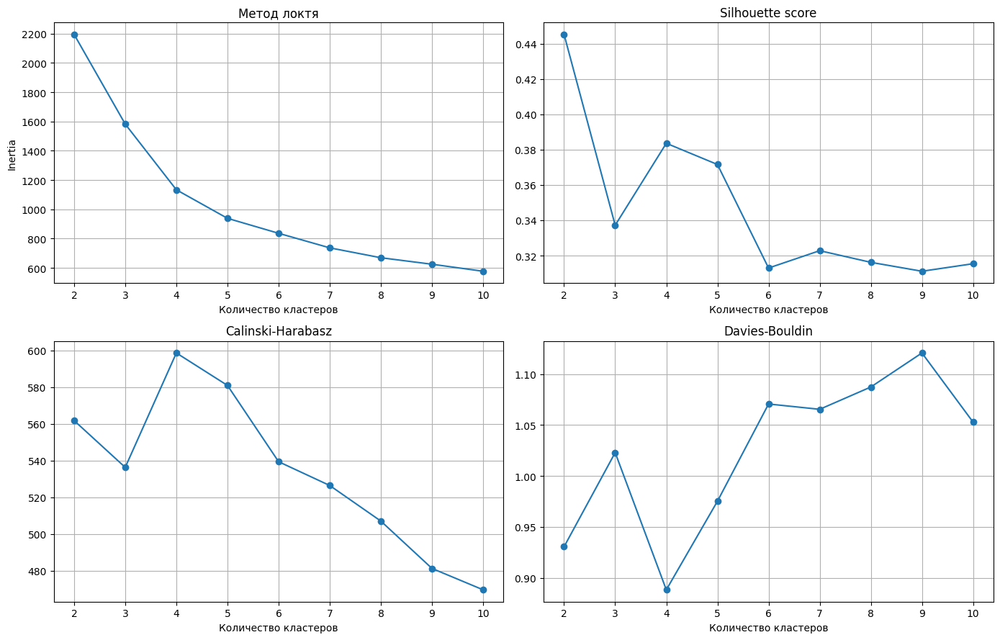

In [ ]:
cluster_features = [
    "pollution_norm",
    "green_norm",
    "water_norm",
    "road_norm",
    "eco_index"
]

X = h3_gdf[cluster_features].fillna(0).copy()
cluster_scaler = StandardScaler()
X_scaled = cluster_scaler.fit_transform(X)

max_k = min(10, len(h3_gdf) - 1)
k_values = list(range(2, max_k + 1))
cluster_scores = []

for k in k_values:
    model = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = model.fit_predict(X_scaled)
    cluster_scores.append({
        "k": k,
        "inertia": model.inertia_,
        "silhouette": silhouette_score(X_scaled, labels),
        "calinski_harabasz": calinski_harabasz_score(X_scaled, labels),
        "davies_bouldin": davies_bouldin_score(X_scaled, labels)
    })

scores_df = pd.DataFrame(cluster_scores)
scores_df["rank_silhouette"] = scores_df["silhouette"].rank(ascending=False)
scores_df["rank_calinski"] = scores_df["calinski_harabasz"].rank(ascending=False)
scores_df["rank_davies"] = scores_df["davies_bouldin"].rank(ascending=True)
scores_df["rank_sum"] = scores_df["rank_silhouette"] + scores_df["rank_calinski"] + scores_df["rank_davies"]
optimal_k = int(scores_df.sort_values("rank_sum").iloc[0]["k"])

print("Оптимальное число кластеров:", optimal_k)
display(scores_df.round(3))

fig, axes = plt.subplots(2, 2, figsize=(14, 9))

axes[0, 0].plot(scores_df["k"], scores_df["inertia"], marker="o")
axes[0, 0].set_title("Метод локтя")
axes[0, 0].set_xlabel("Количество кластеров")
axes[0, 0].set_ylabel("Inertia")
axes[0, 0].grid(True)

axes[0, 1].plot(scores_df["k"], scores_df["silhouette"], marker="o")
axes[0, 1].set_title("Silhouette score")
axes[0, 1].set_xlabel("Количество кластеров")
axes[0, 1].grid(True)

axes[1, 0].plot(scores_df["k"], scores_df["calinski_harabasz"], marker="o")
axes[1, 0].set_title("Calinski-Harabasz")
axes[1, 0].set_xlabel("Количество кластеров")
axes[1, 0].grid(True)

axes[1, 1].plot(scores_df["k"], scores_df["davies_bouldin"], marker="o")
axes[1, 1].set_title("Davies-Bouldin")
axes[1, 1].set_xlabel("Количество кластеров")
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

По расчетам оптимальное число кластеров получилось равным 4. Выбор сделан по суммарному рангу нескольких метрик: Silhouette, Calinski-Harabasz и Davies-Bouldin. Такой вариант дальше используется для сравнения алгоритмов кластеризации.

### **4. Сравнительный анализ алгоритмов кластеризации**


- Реализуйте и сравните следующие алгоритмы кластеризации:
  - K-means
  - Агломеративная кластеризация
  - Спектральная кластеризация
  - DBSCAN (с оптимальным значением eps)
  - HDBSCAN
- Для каждого алгоритма оцените:
  - Качество кластеризации по основным метрикам
  - Распределение точек по кластерам
  - Характерные особенности выявленных кластеров

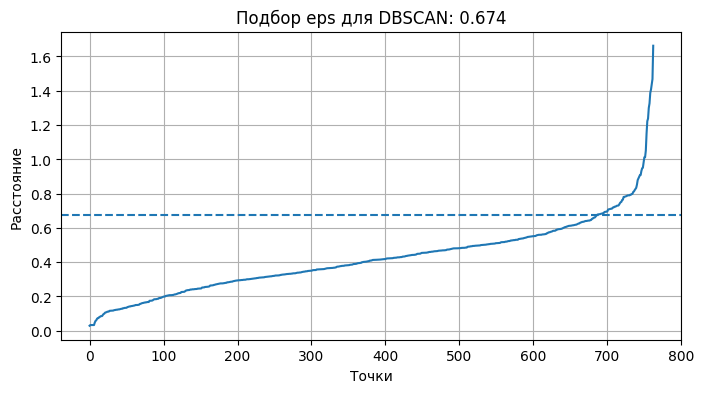

Лучший алгоритм: K-means


,algorithm,n_clusters,noise_points,noise_percent,silhouette,calinski_harabasz,davies_bouldin,rank_sum
0,K-means,4,0,0.000,0.384,598.545,0.888,7.0
1,Agglomerative,4,0,0.000,0.320,468.262,0.925,10.0
2,Spectral,4,0,0.000,0.294,464.618,0.872,10.0
3,DBSCAN,3,36,4.718,0.276,31.868,0.688,13.0
4,HDBSCAN,10,522,68.414,0.498,362.877,0.649,NaN


,cluster,count,percent
0,0,278,36.44
1,1,149,19.53
2,2,159,20.84
3,3,177,23.20


In [ ]:
def evaluate_clustering(labels, algorithm_name):
    labels = np.array(labels)
    noise_points = int((labels == -1).sum())
    noise_percent = noise_points / len(labels) * 100
    mask = labels != -1
    labels_without_noise = labels[mask]
    X_without_noise = X_scaled[mask]
    n_clusters = len(set(labels_without_noise))

    if n_clusters < 2 or len(X_without_noise) <= n_clusters:
        return {
            "algorithm": algorithm_name,
            "n_clusters": n_clusters,
            "noise_points": noise_points,
            "noise_percent": noise_percent,
            "silhouette": np.nan,
            "calinski_harabasz": np.nan,
            "davies_bouldin": np.nan
        }

    return {
        "algorithm": algorithm_name,
        "n_clusters": n_clusters,
        "noise_points": noise_points,
        "noise_percent": noise_percent,
        "silhouette": silhouette_score(X_without_noise, labels_without_noise),
        "calinski_harabasz": calinski_harabasz_score(X_without_noise, labels_without_noise),
        "davies_bouldin": davies_bouldin_score(X_without_noise, labels_without_noise)
    }

def find_dbscan_eps(X_data, neighbors=5):
    neighbors = min(neighbors, len(X_data) - 1)
    nn = NearestNeighbors(n_neighbors=neighbors)
    nn.fit(X_data)
    distances, ids = nn.kneighbors(X_data)
    k_distances = np.sort(distances[:, -1])
    eps = float(np.percentile(k_distances, 90))

    plt.figure(figsize=(8, 4))
    plt.plot(k_distances)
    plt.axhline(eps, linestyle="--")
    plt.title(f"Подбор eps для DBSCAN: {eps:.3f}")
    plt.xlabel("Точки")
    plt.ylabel("Расстояние")
    plt.grid(True)
    plt.show()

    return eps

dbscan_eps = find_dbscan_eps(X_scaled, neighbors=5)

cluster_results = {
    "K-means": KMeans(n_clusters=optimal_k, random_state=42, n_init=10).fit_predict(X_scaled),
    "Agglomerative": AgglomerativeClustering(n_clusters=optimal_k).fit_predict(X_scaled),
    "Spectral": SpectralClustering(
        n_clusters=optimal_k,
        random_state=42,
        assign_labels="kmeans",
        affinity="nearest_neighbors"
    ).fit_predict(X_scaled),
    "DBSCAN": DBSCAN(eps=dbscan_eps, min_samples=5).fit_predict(X_scaled),
    "HDBSCAN": hdbscan.HDBSCAN(min_cluster_size=10, min_samples=5).fit_predict(X_scaled)
}

comparison = []
for name, labels in cluster_results.items():
    comparison.append(evaluate_clustering(labels, name))

comparison_df = pd.DataFrame(comparison)

valid_comparison = comparison_df.dropna(
    subset=["silhouette", "calinski_harabasz", "davies_bouldin"]
).copy()

valid_comparison = valid_comparison[
    (valid_comparison["noise_percent"] <= 30)
    & (valid_comparison["n_clusters"] >= 2)
].copy()

valid_comparison["rank_silhouette"] = valid_comparison["silhouette"].rank(ascending=False)
valid_comparison["rank_calinski"] = valid_comparison["calinski_harabasz"].rank(ascending=False)
valid_comparison["rank_davies"] = valid_comparison["davies_bouldin"].rank(ascending=True)
valid_comparison["rank_noise"] = valid_comparison["noise_percent"].rank(ascending=True)

valid_comparison["rank_sum"] = (
    valid_comparison["rank_silhouette"]
    + valid_comparison["rank_calinski"]
    + valid_comparison["rank_davies"]
    + valid_comparison["rank_noise"]
)

best_algorithm = valid_comparison.sort_values("rank_sum").iloc[0]["algorithm"]
h3_gdf["best_cluster"] = cluster_results[best_algorithm]

comparison_df = comparison_df.merge(
    valid_comparison[["algorithm", "rank_sum"]],
    on="algorithm",
    how="left"
).sort_values("rank_sum", na_position="last")

print("Лучший алгоритм:", best_algorithm)
display(comparison_df.round(3))

cluster_distribution = h3_gdf["best_cluster"].value_counts().sort_index().reset_index()
cluster_distribution.columns = ["cluster", "count"]
cluster_distribution["percent"] = (cluster_distribution["count"] / len(h3_gdf) * 100).round(2)

display(cluster_distribution)

В сравнении рассматривались K-means, агломеративная кластеризация, спектральная кластеризация, DBSCAN и HDBSCAN. Итоговым алгоритмом выбран K-means: он выделил 4 кластера без шумовых точек и показал лучший общий результат по рангу. HDBSCAN не выбран, потому что большая часть точек попала в шум.

### **5. Визуализация и интерпретация результатов**


- Визуализируйте результаты кластеризации на карте с использованием leafmap
- Постройте тепловые карты средних значений экологических факторов для каждого кластера
- Выполните снижение размерности с помощью PCA и визуализируйте кластеры в двумерном пространстве
- Проанализируйте профили кластеров и составьте их экологические характеристики
- Разработайте рекомендации по улучшению экологической обстановки для каждого типа территории

Map(center=[55.7889641, 49.17803110003625], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_i…

,pollution_density_1600,green_pct_800,water_length_1600,road_density_1600,eco_index
best_cluster,,,,,
0,1.040,18.772,5.439,0.387,0.039
1,7.414,12.802,11.956,2.241,-0.201
2,0.800,58.562,7.688,0.467,0.190
3,1.513,12.174,32.664,0.457,0.068


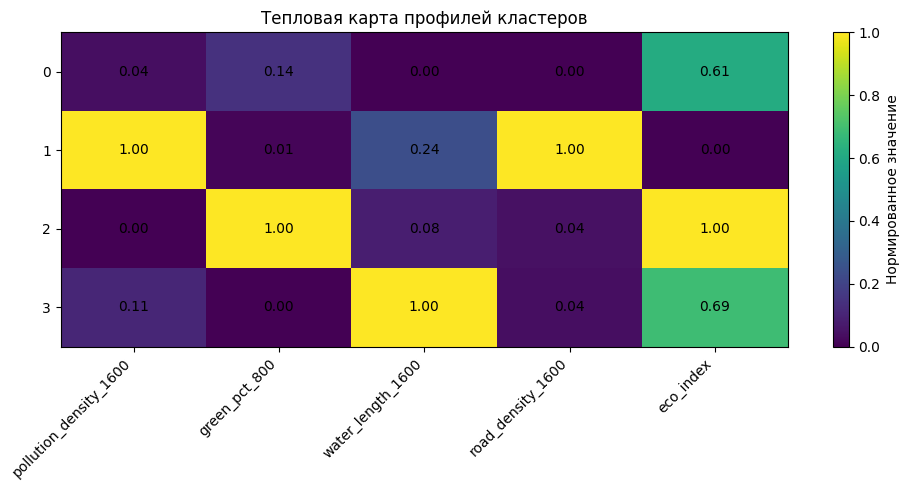

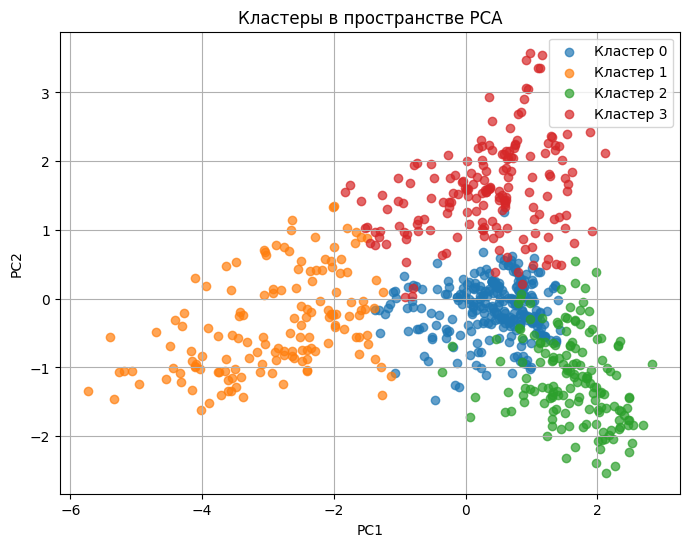

,cluster,тип_зоны,характеристика,рекомендация
0,0,смешанная городская зона,"экоиндекс 0.04, зелень 18.8%, дороги 0.39 км/км²",улучшать среду по самому слабому показателю
1,1,зона с высокой антропогенной нагрузкой,"экоиндекс -0.20, зелень 12.8%, дороги 2.24 км/км²",добавлять озеленение вдоль дорог и около источ...
2,2,зеленая благоприятная зона,"экоиндекс 0.19, зелень 58.6%, дороги 0.47 км/км²",сохранять зеленые зоны и не увеличивать нагрузку
3,3,зона около водных объектов,"экоиндекс 0.07, зелень 12.2%, дороги 0.46 км/км²",сохранять водоохранные зоны и добавлять озелен...


In [ ]:
h3_viz = h3_gdf.to_crs("EPSG:4326").copy()

map_ecology = leafmap.Map(
    center=[city_center.y, city_center.x],
    zoom=11,
    basemap="CartoDB.Positron"
)

map_ecology.add_data(
    h3_viz,
    column="best_cluster",
    cmap="Set2",
    legend_title="Кластеры",
    layer_name="Кластеры"
)

map_ecology.add_data(
    h3_viz,
    column="eco_index",
    cmap="YlGn",
    legend_title="Экоиндекс",
    layer_name="Экоиндекс"
)

map_ecology.add_data(
    h3_viz,
    column="pollution_density_1600",
    cmap="Reds",
    legend_title="Источники загрязнения",
    layer_name="Загрязнение"
)

map_ecology.add_data(
    h3_viz,
    column="green_pct_800",
    cmap="Greens",
    legend_title="Зеленые зоны",
    layer_name="Зелень"
)

map_ecology.add_data(
    h3_viz,
    column="road_density_1600",
    cmap="OrRd",
    legend_title="Плотность дорог",
    layer_name="Дороги"
)

map_ecology.add_data(
    h3_viz,
    column="water_length_1600",
    cmap="Blues",
    legend_title="Водные объекты",
    layer_name="Вода"
)

map_ecology.to_html("map_ecology_kazan.html")
display(map_ecology)

profile_cols = [
    "pollution_density_1600",
    "green_pct_800",
    "water_length_1600",
    "road_density_1600",
    "eco_index"
]

cluster_profile = h3_gdf.groupby("best_cluster")[profile_cols].mean().round(3)

display(cluster_profile)

profile_scaled = pd.DataFrame(
    MinMaxScaler().fit_transform(cluster_profile),
    index=cluster_profile.index,
    columns=cluster_profile.columns
)

plt.figure(figsize=(10, 5))
plt.imshow(profile_scaled, aspect="auto")
plt.xticks(range(len(profile_scaled.columns)), profile_scaled.columns, rotation=45, ha="right")
plt.yticks(range(len(profile_scaled.index)), profile_scaled.index)
plt.colorbar(label="Нормированное значение")
plt.title("Тепловая карта профилей кластеров")

for i in range(profile_scaled.shape[0]):
    for j in range(profile_scaled.shape[1]):
        plt.text(j, i, f"{profile_scaled.iloc[i, j]:.2f}", ha="center", va="center")

plt.tight_layout()
plt.show()

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": h3_gdf["best_cluster"]
})

plt.figure(figsize=(8, 6))

for cl in sorted(pca_df["cluster"].unique()):
    part = pca_df[pca_df["cluster"] == cl]
    plt.scatter(part["PC1"], part["PC2"], label=f"Кластер {cl}", alpha=0.7)

plt.title("Кластеры в пространстве PCA")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid(True)
plt.show()

max_pollution_cluster = cluster_profile["pollution_density_1600"].idxmax()
max_road_cluster = cluster_profile["road_density_1600"].idxmax()
max_green_cluster = cluster_profile["green_pct_800"].idxmax()
max_water_cluster = cluster_profile["water_length_1600"].idxmax()

rows = []

for cl, row in cluster_profile.iterrows():
    if cl == max_pollution_cluster and cl == max_road_cluster:
        zone_type = "зона с высокой антропогенной нагрузкой"
        recommendation = "добавлять озеленение вдоль дорог и около источников загрязнения"

    elif cl == max_pollution_cluster:
        zone_type = "зона около источников загрязнения"
        recommendation = "усилить санитарные зеленые зоны"

    elif cl == max_road_cluster:
        zone_type = "зона с высокой дорожной нагрузкой"
        recommendation = "добавлять озеленение вдоль дорог"

    elif cl == max_green_cluster:
        zone_type = "зеленая благоприятная зона"
        recommendation = "сохранять зеленые зоны и не увеличивать нагрузку"

    elif cl == max_water_cluster:
        zone_type = "зона около водных объектов"
        recommendation = "сохранять водоохранные зоны и добавлять озеленение"

    else:
        zone_type = "смешанная городская зона"
        recommendation = "улучшать среду по самому слабому показателю"

    rows.append({
        "cluster": cl,
        "тип_зоны": zone_type,
        "характеристика": f"экоиндекс {row['eco_index']:.2f}, зелень {row['green_pct_800']:.1f}%, дороги {row['road_density_1600']:.2f} км/км²",
        "рекомендация": recommendation
    })

recommendations_df = pd.DataFrame(rows)

display(recommendations_df)

h3_viz.to_file("h3_ecology_kazan.geojson", driver="GeoJSON")

По результатам кластеризации выделены 4 типа зон. Кластер 0 относится к смешанной городской зоне. Кластер 1 имеет высокую антропогенную нагрузку из-за загрязнения и дорог. Кластер 2 является наиболее благоприятным, так как в нем больше зеленых территорий и выше экоиндекс. Кластер 3 связан с водными объектами, поэтому для него важны водоохранные зоны и дополнительное озеленение.

### **6. Разработка моделей классификации**


- На основе результатов лучшего алгоритма кластеризации подготовьте данные для обучения классификаторов
- Обучите и сравните различные модели классификации:
  - Логистическая регрессия
  - Дерево решений
  - Случайный лес
  - Градиентный бустинг
  - SVM
  - K-ближайших соседей
- Оцените качество моделей с использованием кросс-валидации
- Выберите оптимальную модель и сохраните её для дальнейшего использования

In [ ]:
model_df = pd.DataFrame(X_scaled, columns=cluster_features)
model_df["cluster"] = h3_gdf["best_cluster"].values

X_model = model_df[cluster_features]
y_model = model_df["cluster"]

class_counts = y_model.value_counts()
min_class_count = class_counts.min()

X_train, X_test, y_train, y_test = train_test_split(
    X_model,
    y_model,
    test_size=0.25,
    random_state=42,
    stratify=y_model
)

classifiers = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Decision Tree": DecisionTreeClassifier(max_depth=5, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=120, max_depth=7, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "SVM": SVC(kernel="rbf", C=2, gamma="scale", random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=min(5, len(X_train)))
}

classification_results = []
trained_models = {}
cv_n = min(5, int(min_class_count))

for model_name, model in classifiers.items():
    model.fit(X_train, y_train)
    trained_models[model_name] = model

    y_pred = model.predict(X_test)

    if cv_n >= 2:
        cv = StratifiedKFold(n_splits=cv_n, shuffle=True, random_state=42)
        cv_scores = cross_val_score(model, X_model, y_model, cv=cv, scoring="f1_macro")
        cv_mean = cv_scores.mean()
    else:
        cv_mean = np.nan

    classification_results.append({
        "model": model_name,
        "accuracy": accuracy_score(y_test, y_pred),
        "precision_macro": precision_score(y_test, y_pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_test, y_pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_test, y_pred, average="macro", zero_division=0),
        "cv_f1_macro": cv_mean
    })

classification_df = pd.DataFrame(classification_results)
sort_column = "cv_f1_macro" if classification_df["cv_f1_macro"].notna().any() else "f1_macro"
classification_df = classification_df.sort_values(sort_column, ascending=False)

display(classification_df.round(3))

best_model_name = classification_df.iloc[0]["model"]
best_model = trained_models[best_model_name]

print("Лучшая модель:", best_model_name)
print(classification_report(y_test, best_model.predict(X_test), zero_division=0))

model_data = {
    "model": best_model,
    "features": cluster_features,
    "cluster_algorithm": best_algorithm
}

_ = joblib.dump(model_data, "best_ecology_classifier_kazan.joblib")

,model,accuracy,precision_macro,recall_macro,f1_macro,cv_f1_macro
4,SVM,0.974,0.972,0.974,0.972,0.983
0,Logistic Regression,0.979,0.977,0.979,0.978,0.981
2,Random Forest,0.979,0.982,0.975,0.978,0.968
5,KNN,0.963,0.962,0.960,0.960,0.966
3,Gradient Boosting,0.969,0.970,0.965,0.967,0.959
1,Decision Tree,0.963,0.961,0.959,0.960,0.958


Лучшая модель: SVM
              precision    recall  f1-score   support

           0       1.00      0.97      0.99        70
           1       1.00      0.97      0.99        37
           2       0.95      0.95      0.95        40
           3       0.94      1.00      0.97        44

    accuracy                           0.97       191
   macro avg       0.97      0.97      0.97       191
weighted avg       0.97      0.97      0.97       191



Для классификации использованы результаты лучшей кластеризации. Модели обучались определять номер экологического кластера по рассчитанным признакам. Лучший результат показала SVM: accuracy около 0,97, F1-macro около 0,97, а средний результат кросс-валидации получился около 0,98.

## **Требования к отчету (Структуре блокнота)**



1. Описание выбранной территории и источников данных
2. Методика расчета экологических показателей с обоснованием выбора буферных зон и весовых коэффициентов
3. Сравнительный анализ результатов кластеризации с обоснованием выбора оптимального алгоритма
4. Карты распределения экологических факторов и результатов кластеризации
5. Подробная характеристика выявленных экологических зон (кластеров) с рекомендациями по их развитию
6. Анализ эффективности разработанных моделей классификации
7. Выводы об экологическом состоянии исследуемой территории и возможностях практического применения полученных результатов

##**Вывод:**
В работе выполнен геоанализ экологических факторов Казани. Данные OpenStreetMap были загружены по основным экологическим слоям и агрегированы в H3-сетку. После расчета показателей и экологического индекса были сравнены разные алгоритмы кластеризации. Лучшим вариантом стал K-means с 4 кластерами. По итогам выделены смешанные городские зоны, зоны высокой антропогенной нагрузки, зеленые благоприятные зоны и зоны около водных объектов. Также были обучены модели классификации, из которых лучший результат показала SVM. Полученные результаты можно использовать для предварительной оценки экологического состояния городских участков.